In [1]:
%cd ..

/home/horstl/git/Music-recognition


In [2]:
import IPython.display as ipd
from pathlib import Path
from PIL import Image
import torch
import torchaudio

from musicrecognition.audio_dataloader import AudioDataloader
from musicrecognition.train import get_song_paths
from musicrecognition.augmentation import get_augmenter
from musicrecognition.spectrogram import get_spectrogram_func

def plot_spec(specgram):
    return Image.fromarray(((specgram - specgram.min()) / (specgram - specgram.min()).max() * 255).numpy().astype('uint8'))

/home/horstl/git/Music-recognition/venv/lib/python3.8/site-packages/torchaudio/backend/utils.py:46: UserWarning: "torchaudio.USE_SOUNDFILE_LEGACY_INTERFACE" flag is deprecated and will be removed in 0.9.0. Please remove the use of flag.
  warnings.warn(


In [9]:
data_root = Path('data')
songs_paths = get_song_paths(data_root / 'songs')
augmenter = get_augmenter(data_root / 'background_noises')
audio_loader = AudioDataloader(songs_paths, augmenter, 4, 10, 30, 44100)

anchors, positives, negatives = next(audio_loader)

ipd.display(ipd.Audio(anchors[0], rate=44100))
ipd.display(ipd.Audio(positives[0], rate=44100))
ipd.display(ipd.Audio(negatives[0], rate=44100))

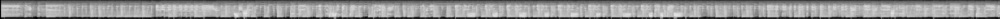

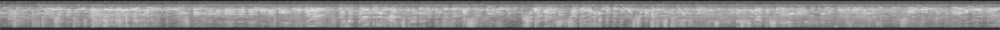

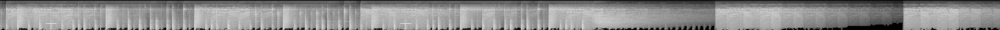

In [10]:
spectrogram_func = get_spectrogram_func(44100)
audio_loader_spec = AudioDataloader(songs_paths, augmenter, 4, 10, 30, 44100, spectrogram_func)

anchors, positives, negatives = next(audio_loader_spec)

display(plot_spec(anchors[0]))
display(plot_spec(positives[0]))
display(plot_spec(negatives[0]))